# Neuromodulated Plasticity
**Jin Yeom**

In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from matplotlib.animation import ArtistAnimation
from scipy.ndimage import gaussian_filter
from IPython.display import HTML
import torch
from torch import distributions

In [2]:
from backpropamine import RetroactiveNeuromodulation
from backpropamine import MazeNavigationTask

In [3]:
# NOTE: from https://github.com/openai/baselines/blob/master/baselines/common/plot_util.py
def smooth(y, radius, mode='two_sided', valid_only=False):
    '''
    Smooth signal y, where radius is determines the size of the window
    mode='twosided':
        average over the window [max(index - radius, 0), min(index + radius, len(y)-1)]
    mode='causal':
        average over the window [max(index - radius, 0), index]
    valid_only: put nan in entries where the full-sized window is not available
    '''
    assert mode in ('two_sided', 'causal')
    if len(y) < 2*radius+1:
        return np.ones_like(y) * y.mean()
    elif mode == 'two_sided':
        convkernel = np.ones(2 * radius+1)
        out = (np.convolve(y, convkernel, mode='same') / 
            np.convolve(np.ones_like(y), convkernel, mode='same'))
        if valid_only:
            out[:radius] = out[-radius:] = np.nan
    elif mode == 'causal':
        convkernel = np.ones(radius)
        out = (np.convolve(y, convkernel, mode='full') / 
            np.convolve(np.ones_like(y), convkernel, mode='full'))
        out = out[:-radius+1]
        if valid_only:
            out[:radius] = np.nan
    return out

In [4]:
def anime_plot(matrices, dpi=100, interval=25, blur=False, sigma=2.0):
    fig = plt.figure(dpi=dpi)
    ims = []
    plt.axis('off')
    for i, mat in enumerate(matrices):
        if blur:
            mat = gaussian_filter(mat, sigma)
        im = plt.imshow(mat, cmap=plt.cm.coolwarm, animated=True)
        txt = plt.text(0.0, 0.0, f'step = {i}')
        ims.append([im, txt])
    anime = ArtistAnimation(fig, ims, interval=interval, blit=True)
    plt.close(fig=fig)
    return anime

In [5]:
def export_video(images, filename, fps=4):
    import cv2
    height, width, channel = images[0].shape
    video = cv2.VideoWriter(filename, cv2.VideoWriter_fourcc(*'mp4v'), fps, (width, height))
    for img in images:
        video.write(img)
    video.release()
    cv2.destroyAllWindows()

## Maze Navigation Task

Let's first plot our reproduced results for the maze navigation task, which include a meta reinforcement learning agent (learning to reinforcement learn, or L2RL), an L2RL agent with an LSTM, a simple neuromodulation agent, and a retroactive neuromodulation agent. If you compare this plot from the figure provided by Miconi et al., you can see that our neuromodulated agents learned faster -- this is likely because we used generalized advantage estimation (GAE) for computing policy gradient.

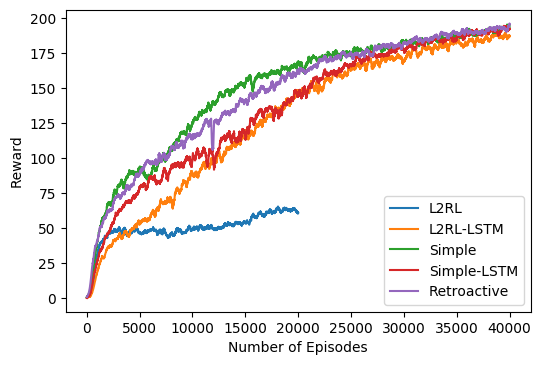

In [9]:
l2rl = pd.read_csv('models/l2rl/progress.csv')
lstm = pd.read_csv('models/lstm/progress.csv')
simple = pd.read_csv('models/simple/progress.csv')
snlstm = pd.read_csv('models/snlstm/progress.csv')
retroactive = pd.read_csv('models/retroactive/progress.csv')

fig = plt.figure(dpi=100)
plt.ylabel('Reward')
plt.xlabel('Number of Episodes')
l2rl_plt, = plt.plot(smooth(l2rl['reward'], 100))
lstm_plt, = plt.plot(smooth(lstm['reward'], 100))
simple_plt, = plt.plot(smooth(simple['reward'], 100))
snlstm_plt, = plt.plot(smooth(snlstm['reward'], 100))
retro_plt, = plt.plot(smooth(retroactive['reward'], 100))
plt.legend([l2rl_plt, lstm_plt, simple_plt, snlstm_plt, retro_plt], 
           ['L2RL', 'L2RL-LSTM', 'Simple', 'Simple-LSTM', 'Retroactive'])
plt.show()

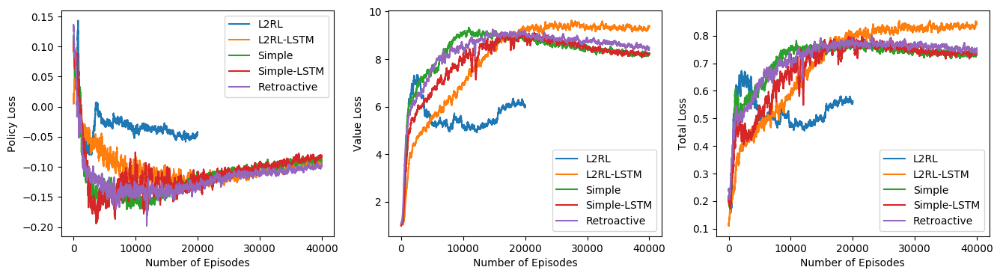

In [10]:
fig, (ploss, vloss, loss) = plt.subplots(1, 3, figsize=(16, 4), dpi=100)

# plot policy loss
ploss.set_ylabel('Policy Loss')
ploss.set_xlabel('Number of Episodes')
l2rl_plt, = ploss.plot(smooth(l2rl['policy_loss'], 100))
lstm_plt, = ploss.plot(smooth(lstm['policy_loss'], 100))
simple_plt, = ploss.plot(smooth(simple['policy_loss'], 100))
snlstm_plt, = ploss.plot(smooth(snlstm['policy_loss'], 100))
retro_plt, = ploss.plot(smooth(retroactive['policy_loss'], 100))
ploss.legend([l2rl_plt, lstm_plt, simple_plt, snlstm_plt, retro_plt], 
             ['L2RL', 'L2RL-LSTM', 'Simple', 'Simple-LSTM', 'Retroactive'])

# plot value loss
vloss.set_ylabel('Value Loss')
vloss.set_xlabel('Number of Episodes')
l2rl_plt, = vloss.plot(smooth(l2rl['value_loss'], 100))
lstm_plt, = vloss.plot(smooth(lstm['value_loss'], 100))
simple_plt, = vloss.plot(smooth(simple['value_loss'], 100))
snlstm_plt, = vloss.plot(smooth(snlstm['value_loss'], 100))
retro_plt, = vloss.plot(smooth(retroactive['value_loss'], 100))
vloss.legend([l2rl_plt, lstm_plt, simple_plt, snlstm_plt, retro_plt], 
             ['L2RL', 'L2RL-LSTM', 'Simple', 'Simple-LSTM', 'Retroactive'])

# plot total loss
loss.set_ylabel('Total Loss')
loss.set_xlabel('Number of Episodes')
l2rl_plt, = loss.plot(smooth(l2rl['loss'], 100))
lstm_plt, = loss.plot(smooth(lstm['loss'], 100))
simple_plt, = loss.plot(smooth(simple['loss'], 100))
snlstm_plt, = loss.plot(smooth(snlstm['loss'], 100))
retro_plt, = loss.plot(smooth(retroactive['loss'], 100))
loss.legend([l2rl_plt, lstm_plt, simple_plt, snlstm_plt, retro_plt], 
             ['L2RL', 'L2RL-LSTM', 'Simple', 'Simple-LSTM', 'Retroactive'])

plt.show()

~~I'm not sure if the value loss curve should look like that... We'll look into that later.~~ Update: looking at some answers on [this Stack Exchange page](https://stats.stackexchange.com/questions/346431/a2c-loss-function-explosion), it seems that we don't have to worry about the loss as much as we should about the cumulative reward.

In [8]:
video = np.load('models/retroactive/lab_40000.npy')
anime = anime_plot(video, dpi=120, interval=120)
HTML(anime.to_html5_video())

In [9]:
W_hh = np.load('models/retroactive/W_40000.npy')

fig, axes = plt.subplots(4, 4, dpi=100, figsize=(8, 8))
ims = []
for i, W in enumerate(W_hh):    
    ax_ims = []
    for agent_id, (ax, w) in enumerate(zip(axes.flatten(), W)):
        w = gaussian_filter(w, 2.0)
        ax.set_axis_off()
        ax.set_title(f'Agent {agent_id}')
        im = ax.imshow(w, cmap=plt.cm.coolwarm, animated=True)
        ax_ims.append(im)
    ims.append(ax_ims)
anime = ArtistAnimation(fig, ims, interval=60, blit=True)
plt.close(fig=fig)
HTML(anime.to_html5_video())

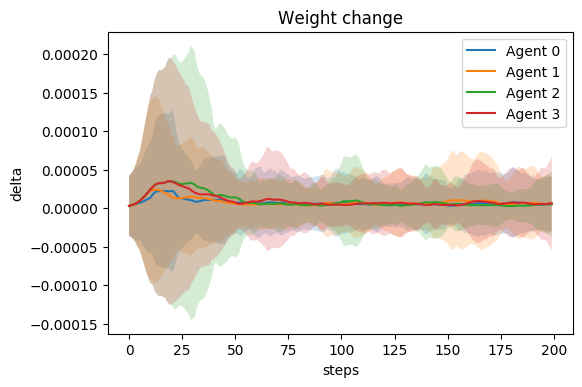

In [10]:
fig = plt.figure(dpi=100)
plt.title('Weight change')
plt.xlabel('steps')
plt.ylabel('delta')

plots = []
ids = []
for i in range(4):  # plot the first 4
    delta = (W_hh[1:, i] - W_hh[:-1, i]) ** 2
    mean = smooth(delta.mean(axis=(1, 2)), 5)
    std = smooth(delta.std(axis=(1, 2)), 5)
    plot, = plt.plot(mean)
    plt.fill_between(range(mean.shape[0]), mean-std, mean+std, alpha=0.2)
    plots.append(plot)
    ids.append(f'Agent {i}')
plt.legend(plots, ids)
plt.show()

In [11]:
hebb = np.load('models/retroactive/hebb_40000.npy')

fig, axes = plt.subplots(4, 4, dpi=100, figsize=(8, 8))
ims = []
for i, H in enumerate(hebb):    
    ax_ims = []
    for agent_id, (ax, h) in enumerate(zip(axes.flatten(), H)):
        ax.set_axis_off()
        ax.set_title(f'Agent {agent_id}')
        im = ax.imshow(h, cmap=plt.cm.coolwarm, animated=True)
        ax_ims.append(im)
    ims.append(ax_ims)
anime = ArtistAnimation(fig, ims, interval=60, blit=True)
plt.close(fig=fig)
HTML(anime.to_html5_video())

In [15]:
env = MazeNavigationTask(11, 1)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
net = RetroactiveNeuromodulation(env.obs_dim, env.act_dim, 100).to(device)
net.load_state_dict(torch.load('models/retroactive/model.pt'))
net.eval()

hidden = torch.zeros(1, 100).to(device)
hebb = torch.zeros(1, *net.W_hh.shape).to(device)
trace = torch.zeros(1, *net.W_hh.shape).to(device)

W = []
hebb = []
entropies = []
mods = []
rewards = []

obs = env.reset(device)
for i in range(200):
    with torch.no_grad():
        act_prob, value_pred, m, hidden, hebb, trace = net(obs, hidden, hebb, trace)
    dist = distributions.OneHotCategorical(act_prob)
    action = dist.sample()
    entropy = dist.entropy()
    obs, rew = env.step(action)
    
    entropies.append(entropy.cpu().numpy()[0])
    mods.append(m.cpu().numpy()[0])
    rewards.append(rew[0])

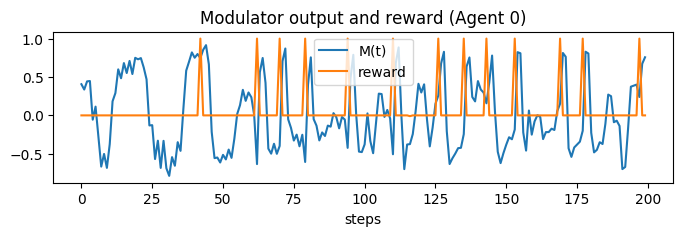

In [16]:
fig = plt.figure(dpi=100, figsize=(8, 2))
plt.title('Modulator output and reward (Agent 0)')
plt.xlabel('steps')
m_plt, = plt.plot(mods)
r_plt, = plt.plot(np.array(rewards)/10) # for better visualization
plt.legend([m_plt, r_plt], ['M(t)', 'reward'])
plt.show()

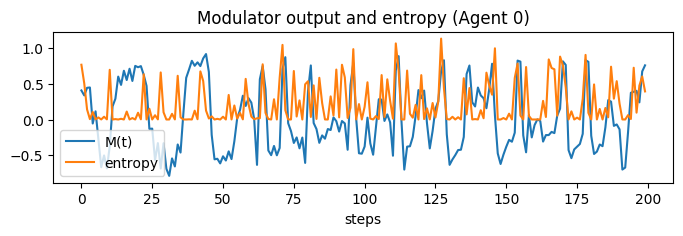

In [17]:
fig = plt.figure(dpi=100, figsize=(8, 2))
plt.title('Modulator output and entropy (Agent 0)')
plt.xlabel('steps')
m_plt, = plt.plot(mods)
H_plt, = plt.plot(entropies)
plt.legend([m_plt, H_plt], ['M(t)', 'entropy'])
plt.show()